In [939]:
"""
Created By    : Joshua Kern
Creation Date : 30 October 2022
Course        : ATSC 528 - Atmospheric Data Analysis
Assignment    : #02 - Successive Corrections

Purpose:
Script to take sparse upper air observations and analyze them on a
polar stereographic map projection using successive corrections.
[PUT MORE INFORMATION HERE - I.E., WHAT SPECIFIC THING IS BEING DONE]

"""
__author__    = "Jared W. Marquis"
__contact__   = "jared.marquis@und.edu"

In [1170]:
### Import Required Modules (shouldn't need to change) ###
import numpy as np                 #numpy for math
import matplotlib.pyplot as plt    #matplotlib for plotting
import cartopy.crs as ccrs         #cartopy for plotting on map
import cartopy.feature as cfeature #cartopy basic shapefiles
import pandas as pd                #Pandas for opening file

In [1171]:
#establish global variables for use
global delx
global dely
global x_knot
global y_knot

In [1231]:
### Make a function for Cressman Analysis ###
def cressmananalysis(num_roi, roi, xx, yy, fo,  back_o = None, analysis_back=None):
    if num_roi == 0 or analysis_back == None:
        weights = np.zeros((len(xx)))
        for i in range(len(xx)):
            rad1 = (xx[i]**2 + yy[i]**2) **0.5
            weight = (roi**2 - rad1**2)/(roi**2 + rad1**2)
            weights[i] = weight
        
        cressa = np.nansum(weights*fo)/np.sum(weights) 
        return cressa
    else:
        cressa = analysis_back
        weights = np.zeros(len(xx))
        for i in range(len(xx)):
            rad1 = (xx[i]**2 + yy[i]**2) **0.5
            weight = (roi**2 - rad1**2)/(roi**2 + rad1**2)
            weights[i] = weight
        
        cressa = analysis_back + (np.nansum(weights*(fo-back_o))/np.nansum(weights))
        return cressa

In [1232]:
### Create function for bilinear interpolation ###
def bilinear_interp(xob, yob, a, num_roi):
    

    xind = (xob - x_knot) / delx
    yind = (yob - y_knot) / delx    
    sq_mat = np.matrix([[1, -1, -1, 1],[0, 0, 1, -1],[0, 1, 0, -1],[0, 0, 0, 1]])
    di = xind - np.floor(xind)
    dj = yind - np.floor(yind)
    xind = int(np.floor(xind))
    yind = int(np.floor(yind))
    a_mat = np.matrix([1, di, dj, di*dj]).T
    fmat = np.matrix([a[yind, xind, num_roi],
            a[yind,xind+1,num_roi],
            a[yind+1, xind,num_roi],
             a[yind+1, xind+1,num_roi]])
    
    
    
    return fmat * sq_mat * a_mat



In [1233]:
#define a method to find the background obs using either Bilinear interpolation, Cressman analysis, or setting it to NaN if not in the ROI
def find_background_obs(roi, num_roi):

    b_obs = np.empty(len(x_observed))
    
    for i in range(len(hgts_500)):
        if x_observed[i] > np.amin(xx) and \
            x_observed[i] < np.amax(xx) and \
            y_observed[i] > np.amin(yy) and \
            y_observed[i] < np.amax(yy):
                #print('In radius ' + str(i))
                b_obs[i] = bilinear_interp(x_observed[i], y_observed[i], analysis_arr, num_roi)
        else: 
            rad = ((x_observed[i]-xx) ** 2 + (y_observed[i]-yy)**2)**0.5
            inds_roia = np.where(rad <= roi)
            
            if np.amin(rad) > roi:
                b_obs[i] = np.nan
            else:
                rel_xb = (x_observed[i] - xx[inds_roia]).flatten()
                rel_yb = (y_observed[i] - yy[inds_roia]).flatten()
                heights = (analysis_arr[:,:,num_roi][inds_roia]).flatten()
                b_obs[i] = cressmananalysis(num_roi, roi, rel_xb, rel_yb, heights)
    return b_obs

In [1234]:
### Read in observations ###
ds = pd.read_csv('./RAOBs_201903131200.txt', names = ['Station', 'Lat', 'Lon', 'Height', 'Wind_dir', 'Wind_spd'])
lons = ds['Lon']
lats = ds['Lat']
hgts_500 = ds['Height']

In [1235]:
### Set up analysis map with a 22x28 rectangular grid of points ###
#The analysis grid is the same as the one for homework 1, so I will recycle this code here.
x_knot = 18.90
y_knot = -6.3
delx = 1.27
dely = 1.27
x_n = 22
y_n = 28


x_grid = np.arange(start = x_knot, stop = (x_knot+x_n*delx) - 1, step=delx)
y_grid = np.arange(start = y_knot, stop = (y_knot+y_n*dely) - 1, step=dely)
xx, yy = np.meshgrid(x_grid, y_grid)

In [1236]:
### convert obs lat/long to x,y ###
rho = 6371 * 1e5
psi_0 = 60 * (np.pi/180)
map_proj = 1/(15e6)
lambda_not = -115

LATS_grid = (180/np.pi) * ((np.pi/2) - (2*np.arctan((np.sqrt((xx/map_proj)**2 + (yy/map_proj)**2))/(rho*(1+np.sin(psi_0)))))) 
LONS_grid = np.arctan(yy/xx) * (180/np.pi) + lambda_not

sigma = (1+np.sin(psi_0))/(1+np.sin((lats*(np.pi/180))))
r = rho * sigma * np.cos(lats*((np.pi/180))) * map_proj
y_observed = r*np.sin((lons*(np.pi/180))-lambda_not * (np.pi/180))
x_observed = r*np.cos(((lons*(np.pi/180)) - (lambda_not*(np.pi/180))))


In [1237]:
#Use radii of influence 4, 2.5, 1.5 *dmin
dmin = calc_dmin(x_observed.values, y_observed.values)
rois = np.array([4, 2.5, 1.5]) * dmin

In [1238]:
#declare empty arrays for storage of values
analysis_arr = np.empty((y_n, x_n, len(rois)))
n_obs_arr = np.empty((y_n, x_n, len(rois)))
background_obs = np.empty((len(hgts_500), len(rois)))

In [1239]:

### First analysis, no successive corrections ###
for i in range(len(xx)):
    for j in range(len(xx[0])):
        rel_x = xx[i, j] - x_observed
        rel_y = yy[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[0])[0]
        n_obs_arr[i, j, 0] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
            
        analysis_arr[i, j, 0] = cressmananalysis(0, rois[0], x_k, y_k, fo)

In [1240]:

### Calculate background 1 and successive correction pass 1
background_obs[:,0] = find_background_obs(rois[0], 0)
for i in range(len(xx)):
    for j in range(len(xx[0])):
        rel_x = xx[i, j] - x_observed
        rel_y = yy[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<rois[1])[0]
        n_obs_arr[i, j, 1] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
        
        back_a = analysis_arr[i,j,0]
        back_o = background_obs[ind_rois, 0]
        analysis_arr[i, j, 1] = cressmananalysis(1, rois[1], x_k, y_k, fo, analysis_back = back_a, back_o = back_o)

In [1241]:
#calculate background pass 2 and correction pass 2
background_obs[:,1] = find_background_obs(rois[1], 1)
for i in range(len(xx)):
    for j in range(len(xx[0])):
        rel_x = xx[i, j] - x_observed
        rel_y = yy[i, j] - y_observed
        rel_rad = (rel_x**2 + rel_y**2) **0.5
        ind_rois = np.where(rel_rad<=rois[2])[0]
        n_obs_arr[i, j, 2] = len(ind_rois)
        
        x_k = rel_x[ind_rois].values
        y_k = rel_y[ind_rois].values
        fo = hgts_500[ind_rois].values
        
        back_a = analysis_arr[i,j,1]
        back_o = background_obs[ind_rois, 1]
        analysis_arr[i, j, 2] = cressmananalysis(2, rois[2], x_k, y_k, fo, analysis_back = back_a, back_o = back_o)

        
print(analysis_arr[:,:,2])

C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\2249451109.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_o))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\2249451109.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_o))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\2249451109.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_o))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\2249451109.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_o))/np.nansum(weights))
C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\2249451109.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back

[[5304.29106046 5337.52480763 5362.62269766 5398.27420089 5426.02975611
  5450.67572515 5473.34383966 5491.4195378  5503.82311856 5510.61134935
  5516.50431102 5527.52264132 5545.67833309 5571.74990893 5603.76846861
  5632.26292579 5656.30180489 5678.75584021 5704.66353836 5709.12026407
            nan           nan]
 [5290.15801567 5310.94086414 5331.39815735 5360.8142665  5392.15755866
  5423.04936604 5445.37749521 5468.72393821 5489.43130218 5492.83898663
  5498.47397923 5508.29754618 5525.14344592 5548.00344331 5570.15686282
  5597.10755745 5631.55578914 5654.0089525  5666.62834836 5685.54612315
  5707.36173597 5721.10248623]
 [5261.22202263 5276.22622143 5288.42075686 5322.54591087 5355.88401802
  5388.38090891 5415.56087729 5444.92321107 5462.66731881 5467.39696772
  5475.22505606 5482.38011912 5495.4005415  5513.09348247 5534.42424694
  5560.5345205  5593.70248736 5620.4312637  5638.90895968 5661.49878243
  5683.94450048 5707.37189867]
 [5236.96551522 5248.05420176 5270.3512102 

C:\Users\Josh\AppData\Local\Temp\ipykernel_5140\2249451109.py:20: RuntimeWarning: invalid value encountered in double_scalars
  cressa = analysis_back + (np.nansum(weights*(fo-back_o))/np.nansum(weights))


In [1242]:

#Calculate differences in analysis fields
diff_21 = analysis_arr[:,:,1] - analysis_arr[:,:,0]
diff_31 = analysis_arr[:,:,2] - analysis_arr[:,:,0]
diff_32 = analysis_arr[:,:,2] - analysis_arr[:,:,1]

In [1243]:
#calculate background 3 and RMS values
b_obs = find_background_obs(rois[2], 2)
background_obs[:,0]


array([5477.84602159, 5545.5091093 , 5379.05803535, 5386.02305598,
       5310.02328544, 5283.77561647,           nan, 5307.40583748,
       5330.56999944, 5515.66240699,           nan, 5497.43991133,
       5394.80189291, 5409.20214547, 5249.54545068, 5508.57027816,
       5297.46135373, 5275.5364643 , 5411.59599703, 5315.56549791,
       5341.79004778, 5293.03275713, 5476.82005805, 5406.52364713,
       5514.51266201, 5385.49400699, 5513.19356226, 5543.54277618,
       5321.93497682, 5697.85794956, 5309.84763936, 5512.59209697,
       5639.80221819, 5587.94445798, 5320.46603253, 5369.57415552,
       5640.98922483, 5734.2055258 , 5299.47830463, 5507.22100679,
       5778.32361205, 5745.09624698, 5448.12998143, 5720.05498228,
       5300.37645549, 5664.19987556, 5731.6559745 , 5534.08550454,
                 nan, 5626.11301309, 5790.51266922, 5704.58512764,
       5578.16325913, 5518.36243534, 5669.61863357, 5522.73252534,
       5519.69218061, 5668.49483294, 5673.1981469 , 5654.04569

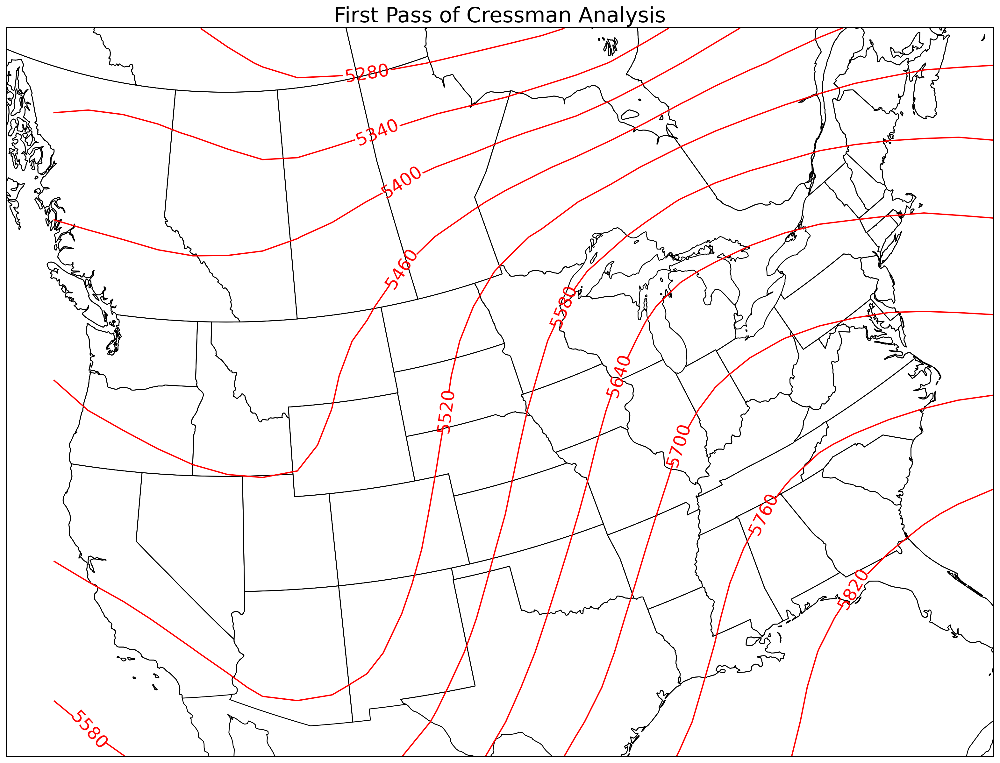

In [1244]:
### Perform 500mb geopotential height analyses using a Cressman weighting Function###
#Use radii of influence 4, 2.5, 1.5 *dmin
### Plot 500mb analyses over a map ###
#use old code...
fig = plt.figure(figsize = (20,20), dpi = 200)
proj = ccrs.Stereographic(central_longitude=-115, central_latitude=90, true_scale_latitude = 60)
ax1 = plt.subplot(111, projection = proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
cs1 = ax1.contour(LONS_grid, LATS_grid, analysis_arr[:,:,0], colors = 'red', levels = np.arange(0,8000,60), transform = ccrs.PlateCarree())
plt.clabel(cs1, levels=np.arange(0,8000,60))
plt.title('First Pass of Cressman Analysis')
plt.show()


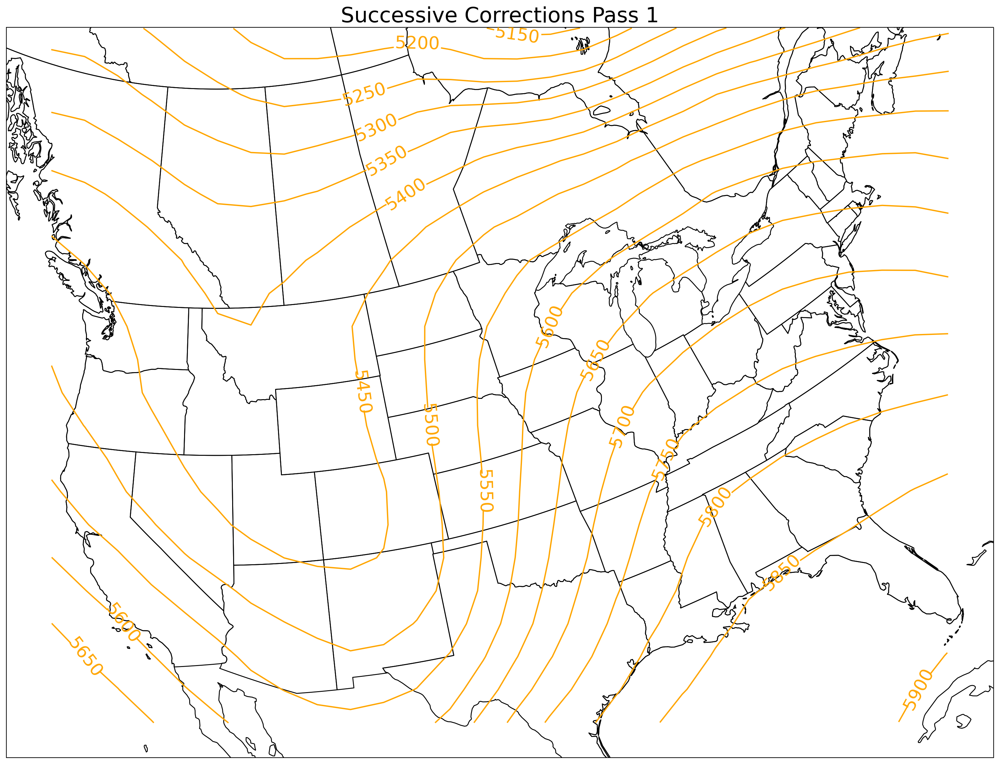

In [1245]:
### Plot Cressman
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotpass1 = ax1.contour(LONS_grid,LATS_grid,analysis_arr[:,:,1],colors='orange',levels=np.arange(0,8000,50),transform=ccrs.PlateCarree())
plt.clabel(plotpass1,levels=np.arange(0,8000,50))
plt.title('Successive Corrections Pass 1')
plt.savefig('Successive Corrections Pass 1')
plt.show()

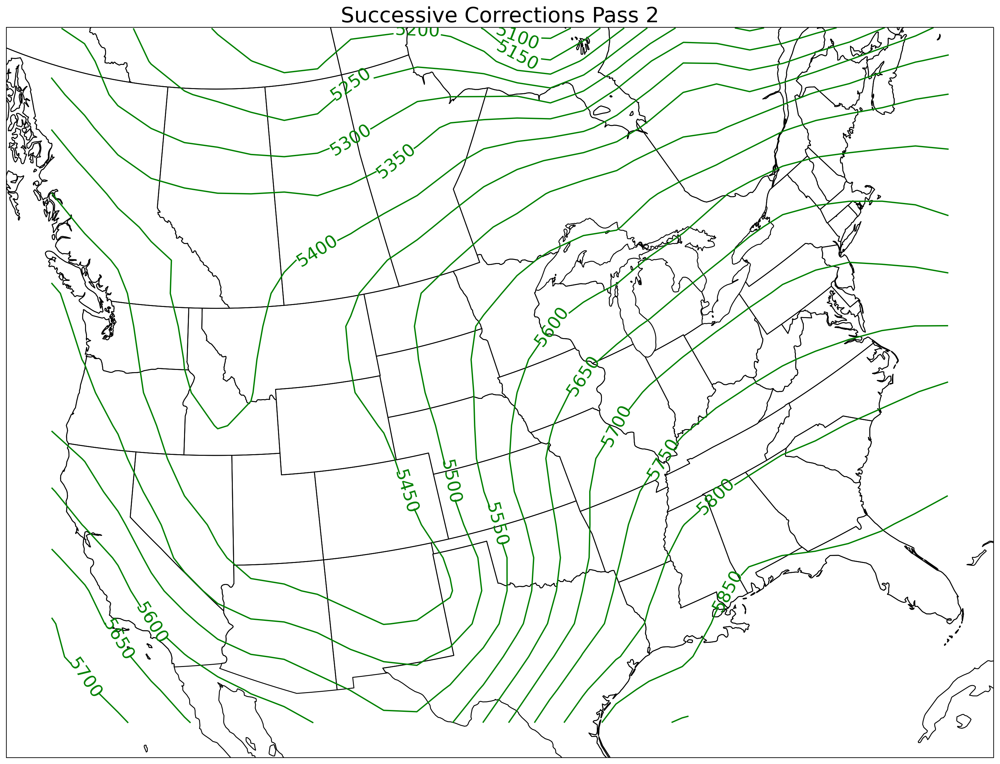

In [1246]:

### Plot Pass 1
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotpass2 = ax1.contour(LONS_grid,LATS_grid,analysis_arr[:,:,2],colors='green',levels=np.arange(0,8000,50),transform=ccrs.PlateCarree())
plt.clabel(plotpass2,levels=np.arange(0,8000,50))
plt.title('Successive Corrections Pass 2')
plt.savefig('Successive Corrections Pass 2')
plt.show()

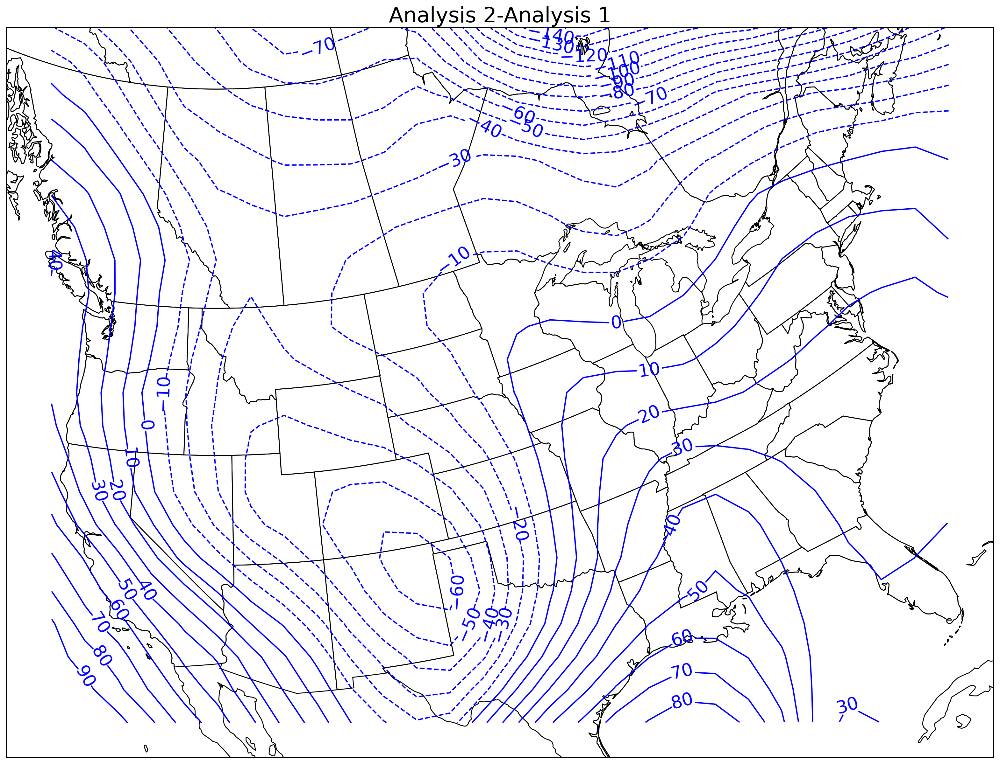

In [1132]:
###Plot Pass 2
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotdiff1 = ax1.contour(LONS_grid,LATS_grid,diff_21,colors='blue',levels=np.arange(-8000,8000,10),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,10))
plt.title('Analysis 2-Analysis 1')
plt.savefig('Analysis 2-Analysis 1')
plt.show()

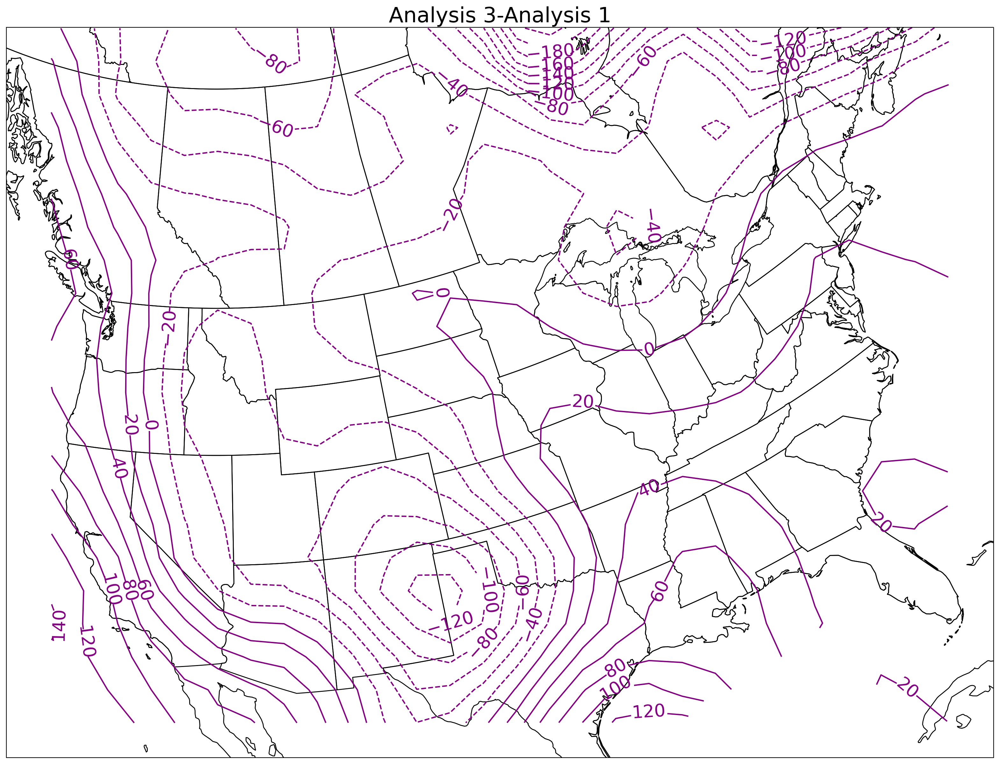

In [1133]:

### Plot Analysis Differences
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotdiff1 = ax1.contour(LONS_grid,LATS_grid,diff_31,colors='purple',levels=np.arange(-8000,8000,20),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,20))
plt.title('Analysis 3-Analysis 1')
plt.savefig('Analysis 3-Analysis 1')
plt.show()

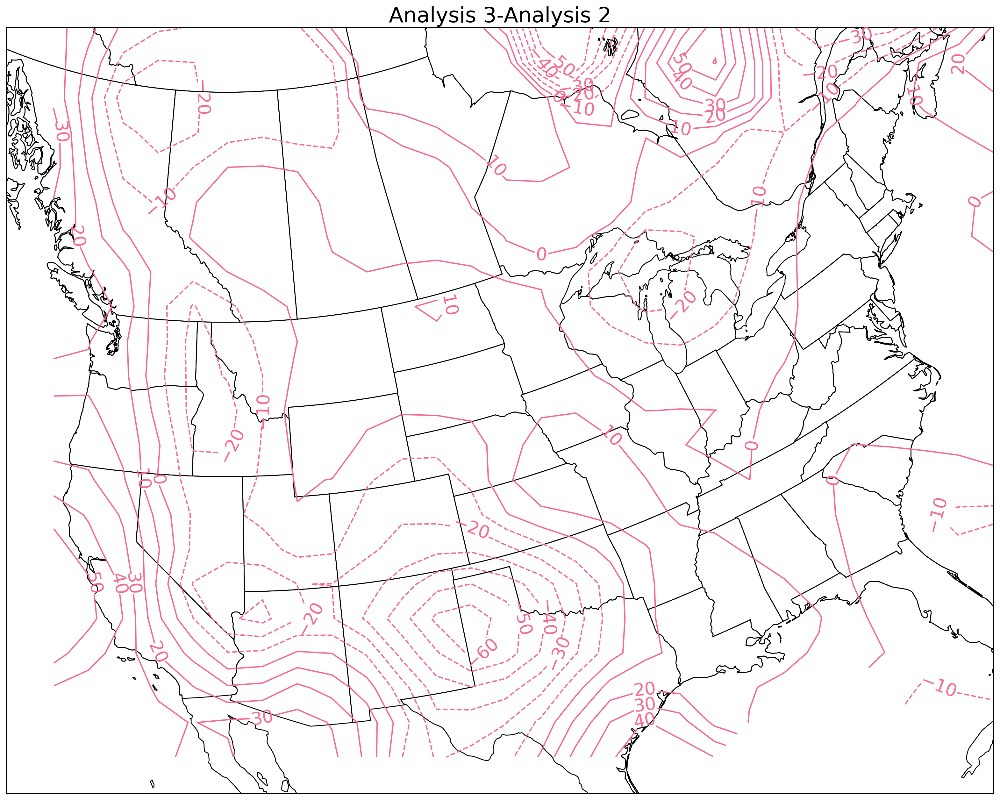

In [1134]:
### Plot Analysis Differences###
proj = ccrs.Stereographic(central_longitude=-115,central_latitude=90,true_scale_latitude=60)
fig = plt.figure(figsize=(20,20),dpi=200)
ax1 = fig.add_subplot(111,projection=proj)
ax1.add_feature(cfeature.STATES)
ax1.add_feature(cfeature.COASTLINE)

plt.rcParams.update({'font.size':20})
plotdiff1 = ax1.contour(LONS_grid,LATS_grid,diff_32,colors='#f56991',levels=np.arange(-8000,8000,10),transform=ccrs.PlateCarree())
plt.clabel(plotdiff1,levels=np.arange(-8000,8000,10))
plt.title('Analysis 3-Analysis 2')
plt.savefig('Analysis 3-Analysis 2')
plt.show()

In [1135]:
### Store the analyses in text files ###


In [1136]:
### Store the difference fields in text files ###


In [ ]:
### Store RMS values in text file ###


In [ ]:
### In a separte text file (or below), answer the following questions ###
'''
1 - Describe the general features that you see in your contoured analyses.
    

2 - Describe the differences that you see in your contoured analyses.  
    Does one analysis seem to be smoother than the other?  If so, what would cause this?
    

3 - What happens as you increase the number of successive correction passes?  Is this 
    desirable?  Why or why not?
    

'''